# Production of Movies in Fast-light and Slow-light modes

## AART Importation

In [5]:
import os
import sys
import platform
# Original path
sistema = platform.system()
print(f"Estás en: {sistema}")

if sistema == "Windows":
    ruta_original = r"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\VariabilityOfBlackHoleLightCurves\Notebooks"
elif sistema == "Linux":
    ruta_original = r"Linux path"
else:
    print(f"No pude identificar el sistema: {sistema}")
    
print(f"Ruta original: {ruta_original}")

# Path of aart_main
if sistema == "Windows":
    ruta_aart =r'C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\VariabilityOfBlackHoleLightCurves'
elif sistema == "Linux":
    ruta_aart == r"Linux path"
else:
    print(f"No pude identificar el sistema: {sistema}")
    
ruta_aart_main = os.path.join(ruta_original,ruta_aart)
print(f"Ruta de aart_main: {ruta_aart_main}")

# Change the working directory so that Python thinks you are inside aart_main
os.chdir(ruta_aart_main)
print(f"Ruta actual después de cambio: {os.getcwd()}")

# put the original path to sys.path for use aart_main 
if ruta_original not in sys.path:
    sys.path.append(ruta_original)
    print(f"Agregado a sys.path: {ruta_original}")

## aart_func is a file with the functions for the image generation
from aart_func import *
## params have all the important params of the simulation
from params import *

Estás en: Windows
Ruta original: C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\VariabilityOfBlackHoleLightCurves\Notebooks
Ruta de aart_main: C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\VariabilityOfBlackHoleLightCurves
Ruta actual después de cambio: C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\VariabilityOfBlackHoleLightCurves


## Importacion de contenido en LensingBandas y RayTracing

In [14]:
fnbands = path + "LensingBands_a_%s_i_%s.h5"%(spin_case,i_case)
print("reading file:",fnbands)
h5f = h5py.File(fnbands,'r')

alpha_critic = h5f['alpha'][:]
beta_critic  = h5f['beta'][:]
hull_0i=h5f['hull_0i'][:]
hull_0e=h5f['hull_0e'][:]
hull_1i=h5f['hull_1i'][:]
hull_1e=h5f['hull_1e'][:]
hull_2i=h5f['hull_2i'][:]
hull_2e=h5f['hull_2e'][:]

supergrid0=h5f['grid0'][:]
N0=int(h5f["N0"][0])
mask0=h5f['mask0'][:]
lim0=int(h5f["lim0"][0])

supergrid1=h5f['grid1'][:]
N1=int(h5f["N1"][0])
mask1=h5f['mask1'][:]
lim1=int(h5f["lim1"][0])

supergrid2=h5f['grid2'][:]
N2=int(h5f["N2"][0])
mask2=h5f['mask2'][:]
lim2=int(h5f["lim2"][0])

h5f.close()


reading file: ./Results/LensingBands_a_0.94_i_17.h5


In [20]:
fnrays="./Results/Rays_a_%s_i_%s.h5"%(spin_case,i_case)
print("Reading file: ",fnrays)
h5f = h5py.File(fnrays,'r')

rs0=h5f['rs0'][:]
sign0=h5f['sign0'][:]
t0=h5f['t0'][:]
phi0=h5f['phi0'][:]

rs1=h5f['rs1'][:]
sign1=h5f['sign1'][:]
t1=h5f['t1'][:]
phi1=h5f['phi1'][:]

rs2=h5f['rs2'][:]
sign2=h5f['sign2'][:]
t2=h5f['t2'][:]
phi2=h5f['phi2'][:]

h5f.close()

Reading file:  ./Results/Rays_a_0.94_i_17.h5


## Inoisy File

### Inoisy.py elements

In [29]:
# Esta es la función que se llama en cada visita del árbol
def print_h5_structure(name, obj):
    print(name)

with h5py.File('inoisy.h5', 'r') as inoisyfile:
    print("Estructura completa del archivo inoisy.h5:")
    inoisyfile.visititems(print_h5_structure)

Estructura completa del archivo inoisy.h5:
data
data/data_env
data/lightcurve_env
data/lightcurve_raw
params
params/armangle
params/betaphi
params/betar
params/dx1
params/dx2
params/gammap
params/mup
params/sigmap
params/spatialcorr
params/spatialcorrxy
params/spin
params/sub_kep
params/x0end
params/x0start
params/x1end
params/x1start
params/x2end
params/x2start


### Lecture of inoisy file

In [14]:
#Abres el documento que ya se encuentra en el repositorio
inoisyfile = h5py.File("inoisy.h5", 'r')
i_fname="inoisy.h5"
print(f'el archivo inoisy.h5 contiene los siguientes directorios: \n', list(inoisyfile.keys()))

# Lecuture of inoisy
data = np.array(inoisyfile['data/data_env'])

data_lc = np.array(inoisyfile['data/lightcurve_env'])
dataclean_lc = np.array(inoisyfile['data/lightcurve_raw']) 

#Limits of the figure
xystart = np.array(inoisyfile['params/x1start'])[0]

print("There are %s snapshots in this inoisy data set"%data.shape[0])
inoisyfile.close()

el archivo inoisy.h5 contiene los siguientes directorios: 
 ['data', 'params']
There are 257 snapshots in this inoisy data set


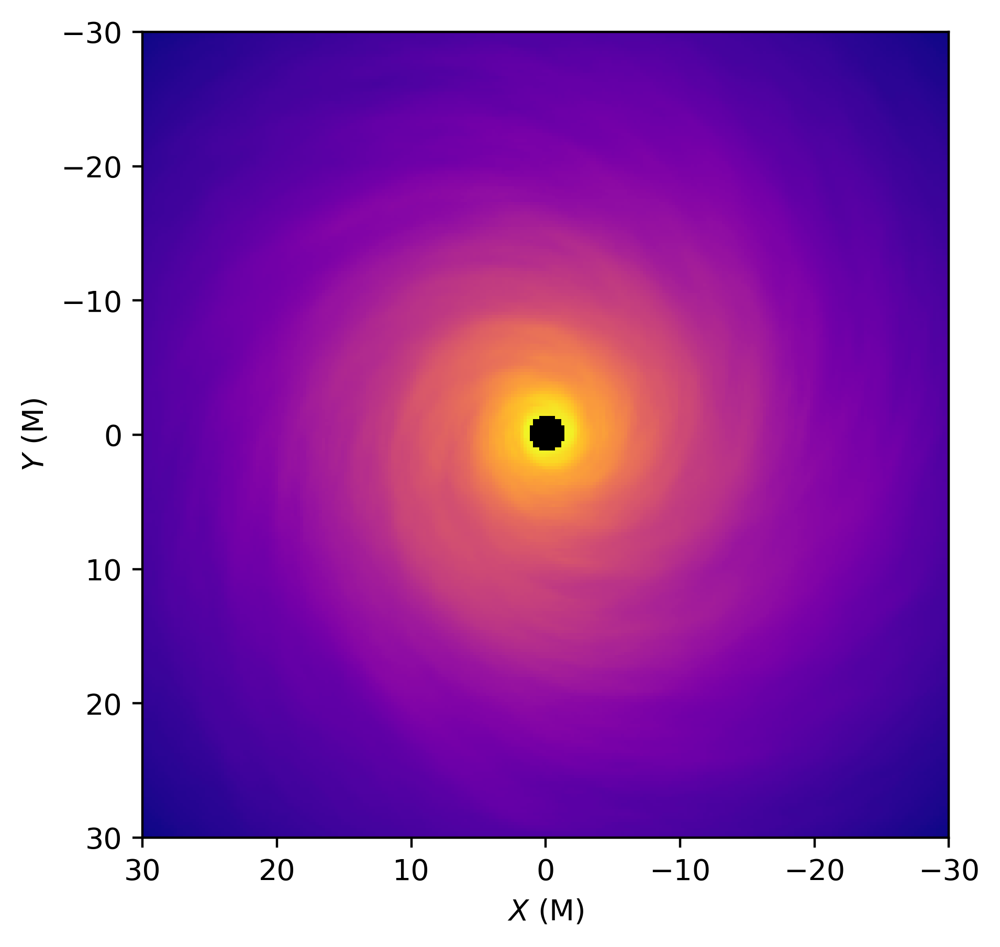

In [9]:
fig, ax = plt.subplots(figsize=[5,5],dpi=400)

#You can select different snapshots by changing the slicing 
ax.imshow(np.log(data[55,:,:]),cmap="plasma",origin="lower",extent=[-xystart,xystart,-xystart,xystart])

ax.set_facecolor('xkcd:black')
ax.set_xlabel(r"$X$"+" "+"(M)")
ax.set_ylabel(r"$Y$"+" "+"(M)")
#plt.savefig(f'InoisySnapshot.png',dpi=400,bbox_inches='tight')
plt.show()

### Movie with inoisy

In [ ]:
fignames=[]
VMAX=np.max(data)
for tsnap in np.arange(snapshots):
    fig, ax = plt.subplots()
    
    ax.imshow(data[tsnap,:,:],origin="lower",cmap="plasma",extent=[-lim0,lim0,-lim0,lim0])
    ax.set_xlim(-10,10)
    ax.set_ylim(-10,10)
    
    ax.set_xlabel(r"$\alpha$"+" "+"(M)")
    ax.set_ylabel(r"$\beta$"+" "+"(M)")
    
    fignames.append('./Results/Movies/Fig%s.png'%tsnap)
    plt.savefig('./Results/Movies/Fig%s.png'%tsnap,dpi=400,bbox_inches='tight')
    plt.close(fig)

with imageio.get_writer('./Results/Movies/BHMovie_Inoisy.gif', mode='I') as writer:
    for filename in fignames:
        image = imageio.imread(filename)
        writer.append_data(image)

# We delete the created images and just keep the GIF
for filename in set(fignames):
    os.remove(filename)

## Slow-light Movie Production

### Data of the movie production using iMovies.py

In [16]:
fimages="./Results/Images_a_%s_i_%s_%s"%(spin_case,i_case,i_fname)

print("Reading file: ",fimages)

h5f = h5py.File(fimages,'r')

Is0=h5f['bghts0'][:]
Is1=h5f['bghts1'][:]
Is2=h5f['bghts2'][:]
h5f.close()

Reading file:  ./Results/Images_a_0.94_i_17_inoisy.h5


### Movie with inoisy + AART in Slow-light mode

In [ ]:
fignames=[]
VMAX=np.max(Is0+Is1+Is2)
for tsnap in np.arange(snapshots):
    fig, ax = plt.subplots()
    
    ax.imshow(Is0[tsnap,:,:]+Is1[tsnap,:,:]+Is2[tsnap,:,:],vmax=VMAX,origin="lower",cmap="plasma",extent=[-lim0,lim0,-lim0,lim0])

    ax.set_xlabel(r"$\alpha$"+" "+"(M)")
    ax.set_ylabel(r"$\beta$"+" "+"(M)")
    
    fignames.append('./Results/Movies/Fig%s.png'%tsnap)
    plt.savefig('./Results/Movies/Fig%s.png'%tsnap,dpi=400,bbox_inches='tight')
    plt.close(fig)

with imageio.get_writer('./Results/Movies/BHMovie.gif', mode='I') as writer:
    for filename in fignames:
        image = imageio.imread(filename)
        writer.append_data(image)

# We delete the created images and just keep the GIF
for filename in set(fignames):
    os.remove(filename)

### Light-Curve 

In [17]:
Light_curve_aart = np.zeros(snapshots)
Itotal = Is0 + Is1 + Is2
for tsnap in range(snapshots):
    Light_curve_aart[tsnap] = np.sum(Is0[tsnap,:,:]) + np.sum(Is1[tsnap,:,:]) + np.sum(Is2[tsnap,:,:])
Max_Light_aart_curve = np.max(Light_curve_aart)

Light_NormalCurve_aart = Light_curve_aart/(Max_Light_aart_curve +0.2*Max_Light_aart_curve)

T_LightCurve_arrt = np.linspace(i_tM,f_tM,snapshots)

In [18]:
Light_curve = np.zeros(256)
for tsnap in range(256):
    Light_curve[tsnap] = np.sum(data[tsnap])

Light_MCurve = Light_curve/np.max(Light_curve)

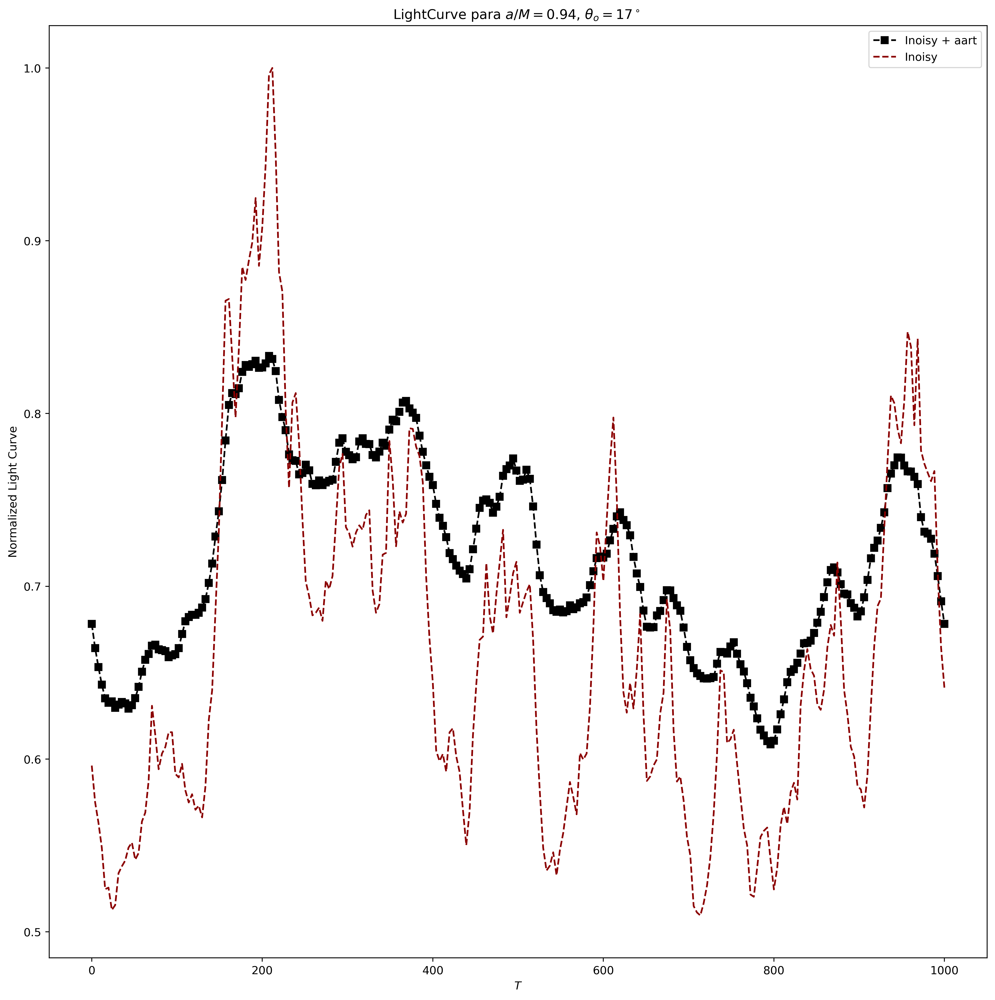

In [14]:
plt.figure(figsize=(15,15),dpi=400)

plt.plot(T_LightCurve_arrt,Light_NormalCurve_aart, 's--r', label ='Inoisy + aart' , color = 'k')
plt.plot(np.linspace(i_tM,f_tM,256),Light_MCurve, linestyle="--", label ='Inoisy' , color = 'darkred')
plt.xlabel(r"$T$")
plt.ylabel(r"Normalized Light Curve")
plt.title(rf'LightCurve para $a/M = {spin_case}$, $\theta_o = {i_case}^\circ$ ')
plt.legend()
#plt.savefig(f"./Results/Imagenes/LightCurve_{spin_case}_{i_case}_1.png",dpi=400,bbox_inches='tight')
plt.show()

## Fast-light Movie Production

In [8]:
fimages="./Results/FastLight_Images_a_%s_i_%s_%s"%(spin_case,i_case,i_fname)

print("Reading file: ",fimages)

h5f = h5py.File(fimages,'r')

I0=h5f['bghts0'][:]
I1=h5f['bghts1'][:]
I2=h5f['bghts2'][:]

print(f'el archivo {fimages} contiene los siguientes directorios: \n', list(h5f.keys()))

h5f.close() 

Reading file:  ./Results/FastLight_Images_a_0.94_i_17_inoisy.h5
el archivo ./Results/FastLight_Images_a_0.94_i_17_inoisy.h5 contiene los siguientes directorios: 
 ['bghts0', 'bghts1', 'bghts2']


In [9]:
Light_curve_fast = np.zeros(snapshots)
for tsnap in range(snapshots):
    Light_curve_fast[tsnap] = np.sum(I0[tsnap,:,:]) + np.sum(I1[tsnap,:,:]) + np.sum(I2[tsnap,:,:])
    
Max_Light_fast_curve = np.nanmax(Light_curve_fast)

Light_NormalCurve_fast = Light_curve_fast/(Max_Light_fast_curve +0.2*Max_Light_fast_curve)


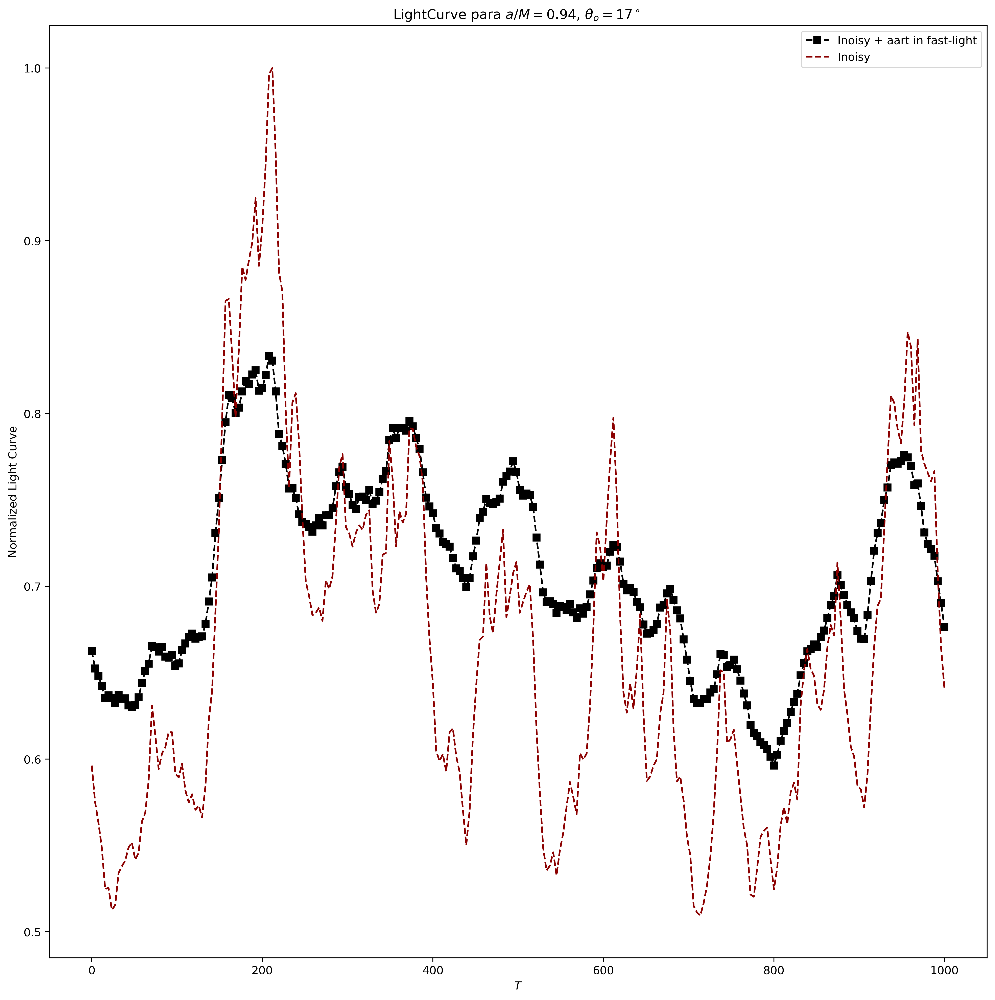

In [30]:
plt.figure(figsize=(15,15),dpi=400)

plt.plot(T_LightCurve_arrt,Light_NormalCurve_fast, 's--r', label ='Inoisy + aart in fast-light' , color = 'k')
plt.plot(np.linspace(i_tM,f_tM,256),Light_MCurve, linestyle="--", label ='Inoisy' , color = 'darkred')
plt.xlabel(r"$T$")
plt.ylabel(r"Normalized Light Curve")
plt.title(rf'LightCurve para $a/M = {spin_case}$, $\theta_o = {i_case}^\circ$ ')
plt.legend()
plt.savefig(f"./Results/Imagenes/LightCurve_{spin_case}_{i_case}_inoisyVSfast.png",dpi=400,bbox_inches='tight')
plt.show()

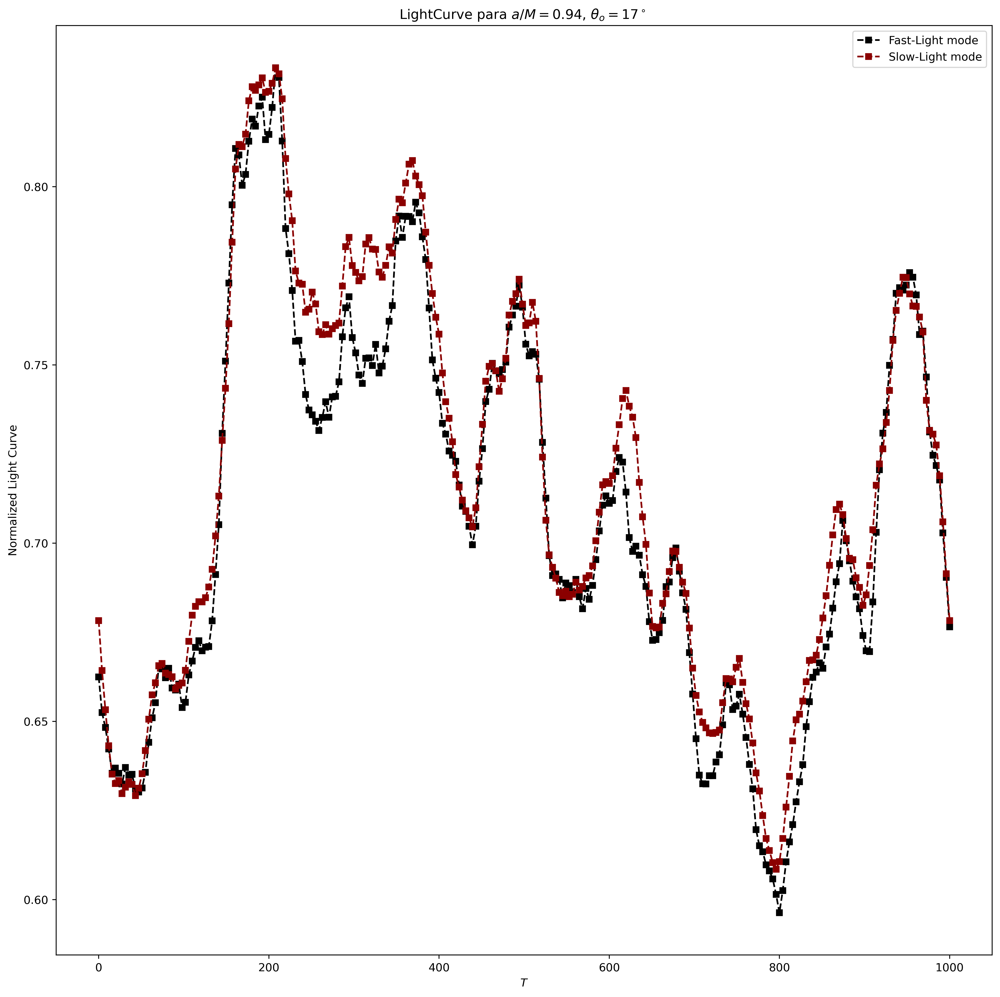

In [37]:
plt.figure(figsize=(15,15),dpi=400)

plt.plot(T_LightCurve_arrt,Light_NormalCurve_fast, 's--r', label ='Fast-Light mode' , color = 'k',markersize=5)
plt.plot(T_LightCurve_arrt,Light_NormalCurve_aart, 's--r', label ='Slow-Light mode' , color = 'darkred',markersize=5)
plt.xlabel(r"$T$")
plt.ylabel(r"Normalized Light Curve")
plt.title(rf'LightCurve para $a/M = {spin_case}$, $\theta_o = {i_case}^\circ$ ')
plt.legend()
plt.savefig(f"./Results/Imagenes/LightCurve_{spin_case}_{i_case}_fastVSslow.png",dpi=400,bbox_inches='tight')
plt.show()

# Analisis de Datos

In [80]:
import similaritymeasures
import numpy as np
from scipy.integrate import simpson
from scipy.spatial.distance import euclidean
from scipy.interpolate import interp1d
import pandas as pd 
import matplotlib.pyplot as plt

In [82]:
#--------------------------------- Estandarización
def estand(f):
    return (f-np.mean(f))/np.std(f)
#--------------------------------- DISTANCIAS L1 Y L2

def distancia_L2(f, g, x):
    return np.sqrt(simpson((f - g)**2, x))

def distancia_L1(f, g, x):
    return simpson(np.abs(f - g), x)

#----------------------------- CORRELACIÓN DE PEARSON FUNCIONAL

def pearson_funcional(f, g, x):
    f_mean = simpson(f, x) / (x[len(x)-1] - x[0])
    g_mean = simpson(g, x) / (x[len(x)-1] - x[0])
    numerator = simpson((f - f_mean) * (g - g_mean), x)
    denominator = np.sqrt(simpson((f - f_mean)**2, x) * simpson((g - g_mean)**2, x))
    return numerator / denominator

def ErrorRelativoPromedio(f,g,x):
    return np.abs(np.sum((f-g)/f)/len(x))

def DesviacionEstandar(f,g,x):
    return np.std((f-g)/f)

def FluxFactor(fluxes):
    maxflux = np.max(fluxes)
    minflux = np.min(fluxes)
    avgflux = np.mean(fluxes)
    stdflux = np.std(fluxes)


#    print("Max= ", maxflux," Min= ", minflux," Avg= ", avgflux," Std= ", stdflux)

    target_flux = 0.6
    fluxfactor = target_flux/avgflux
    return fluxes*fluxfactor

In [106]:

def calcular_metricas(data, dx):
    # Cálculo de métricas
    metricas = {
        "Distancia L²": {
            "inoisy vs slow light": distancia_L2(estand(data["inoisy"]), estand(data["SlowLight"]), estand(data["Time"])),
            "inoisy vs fast light": distancia_L2(estand(data["inoisy"]), estand(data["FastLight"]), estand(data["Time"])),
            "slow light vs fast light": distancia_L2(estand(data["SlowLight"]), estand(data["FastLight"]), estand(data["Time"]))
        },
        "Distancia L¹": {
            "inoisy vs slow light": distancia_L1(estand(data["inoisy"]), estand(data["SlowLight"]), estand(data["Time"])),
            "inoisy vs fast light": distancia_L1(estand(data["inoisy"]), estand(data["FastLight"]), estand(data["Time"])),
            "slow light vs fast light": distancia_L1(estand(data["SlowLight"]), estand(data["FastLight"]), estand(data["Time"]))
        },
        "Correlación Pearson": {
            "inoisy vs slow light": pearson_funcional(estand(data["inoisy"]), estand(data["SlowLight"]), estand(data["Time"])),
            "inoisy vs fast light": pearson_funcional(estand(data["inoisy"]), estand(data["FastLight"]), estand(data["Time"])),
            "slow light vs fast light": pearson_funcional(estand(data["SlowLight"]), estand(data["FastLight"]), estand(data["Time"]))
        }
#        "Error Relativo Prom.": {
#            "inoisy vs slow light": ErrorRelativoPromedio(estand(data["inoisy"]), estand(data["SlowLight"]), estand(data["Time"])),
#            "inoisy vs fast light": ErrorRelativoPromedio(estand(data["inoisy"]), estand(data["FastLight"]), estand(data["Time"])),
#            "slow light vs fast light": ErrorRelativoPromedio(estand(data["SlowLight"]), estand(data["FastLight"]), estand(data["Time"]))
#        }
    }
    return metricas

def calcular_metricas_winoisy(data, dx):
    # Cálculo de métricas
    metricas = {
        "Distancia L²": {
            "slow light vs fast light": distancia_L2(estand(data["SlowLight"]), estand(data["FastLight"]), estand(data["Time"]))
        },
        "Distancia L¹": {
            "slow light vs fast light": distancia_L1(estand(data["SlowLight"]), estand(data["FastLight"]), estand(data["Time"]))
        },
        "Correlación Pearson": {
            "slow light vs fast light": pearson_funcional(estand(data["SlowLight"]), estand(data["FastLight"]), estand(data["Time"]))
        }
#        "Error Relativo Prom.": {
#            "slow light vs fast light": ErrorRelativoPromedio(estand(data["SlowLight"]), estand(data["FastLight"]), estand(data["Time"]))
#        }
    }
    return metricas

## Analisis de datos cambios en la resolución de aart ($dx$)

In [35]:


path_008 = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dx_changes\LightCurve_datas_dx0.08_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_01 = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dx_changes\LightCurve_datas_dx0.1_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_02 = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dx_changes\LightCurve_datas_dx0.2_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_04 = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dx_changes\LightCurve_datas_dx0.4_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_06 = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dx_changes\LightCurve_datas_dx0.6_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_08 = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dx_changes\LightCurve_datas_dx0.8_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_1 = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dx_changes\LightCurve_datas_dx1_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_5 = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dx_changes\LightCurve_datas_dx5.0_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_10 = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dx_changes\LightCurve_datas_dx10.0_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"

data_008 = pd.read_csv(path_008)
data_01 = pd.read_csv(path_01)
data_02 = pd.read_csv(path_02)
data_04 = pd.read_csv(path_04)
data_06 = pd.read_csv(path_06)
data_08 = pd.read_csv(path_08)
data_1 = pd.read_csv(path_1)
data_5 = pd.read_csv(path_5)
data_10 = pd.read_csv(path_10)

In [108]:
# Lista de resoluciones y datos
resoluciones = [
    (data_008, 0.08),
    (data_01, 0.1),
    (data_01, 0.4),
    (data_06, 0.6),
    (data_01, 0.8),
    (data_1, 1.0),
    (data_5, 5.0),
    (data_10, 10.0)
]

# Recolectar todos los datos en un diccionario
datos_totales = {}
for data, dx in resoluciones:
    datos_totales[str(dx)] = calcular_metricas(data, dx)

# Crear el DataFrame multiindex
df = pd.concat(
    {dx: pd.DataFrame(metricas) for dx, metricas in datos_totales.items()},
    axis=0
)

# Nombrar índices y columnas
df.index.names = ['Resolución (dx)', 'Métrica']
df.columns.name = 'Comparación'

# Mostrar el DataFrame
df

Comparación                               Distancia L²  Distancia L¹  \
Resolución (dx) Métrica                                                
0.08            inoisy vs slow light          0.948033      1.369440   
                inoisy vs fast light          0.874726      1.267821   
                slow light vs fast light      0.311160      0.441033   
0.1             inoisy vs slow light          0.948581      1.370814   
                inoisy vs fast light          0.876450      1.270481   
                slow light vs fast light      0.310816      0.440911   
0.4             inoisy vs slow light          0.948581      1.370814   
                inoisy vs fast light          0.876450      1.270481   
                slow light vs fast light      0.310816      0.440911   
0.6             inoisy vs slow light          0.958201      1.381275   
                inoisy vs fast light          0.903867      1.311673   
                slow light vs fast light      0.324971      0.467848   
0.8             inoisy vs slow light          0.948581      1.370814   
                inoisy vs fast light          0.876450      1.270481   
                slow light vs fast light      0.310816      0.440911   
1.0             inoisy vs slow light          0.946355      1.368638   
                inoisy vs fast light          0.886053      1.276051   
                slow light vs fast light      0.396362      0.571334   
5.0             inoisy vs slow light          1.188879      1.710435   
                inoisy vs fast light          1.295025      1.788544   
                slow light vs fast light      1.478660      2.093487   
10.0            inoisy vs slow light          2.043269      2.971550   
                inoisy vs fast light          2.142088      2.989927   
                slow light vs fast light      1.785652      2.576518   

Comparación                               Correlación Pearson  
Resolución (dx) Métrica                                        
0.08            inoisy vs slow light                 0.870226  
                inoisy vs fast light                 0.889535  
                slow light vs fast light             0.986017  
0.1             inoisy vs slow light                 0.870077  
                inoisy vs fast light                 0.889099  
                slow light vs fast light             0.986048  
0.4             inoisy vs slow light                 0.870077  
                inoisy vs fast light                 0.889099  
                slow light vs fast light             0.986048  
0.6             inoisy vs slow light                 0.867424  
                inoisy vs fast light                 0.882061  
                slow light vs fast light             0.984749  
0.8             inoisy vs slow light                 0.870077  
                inoisy vs fast light                 0.889099  
                slow light vs fast light             0.986048  
1.0             inoisy vs slow light                 0.870693  
                inoisy vs fast light                 0.886655  
                slow light vs fast light             0.977312  
5.0             inoisy vs slow light                 0.795811  
                inoisy vs fast light                 0.757908  
                slow light vs fast light             0.684112  
10.0            inoisy vs slow light                 0.397402  
                inoisy vs fast light                 0.337810  
                slow light vs fast light             0.539856

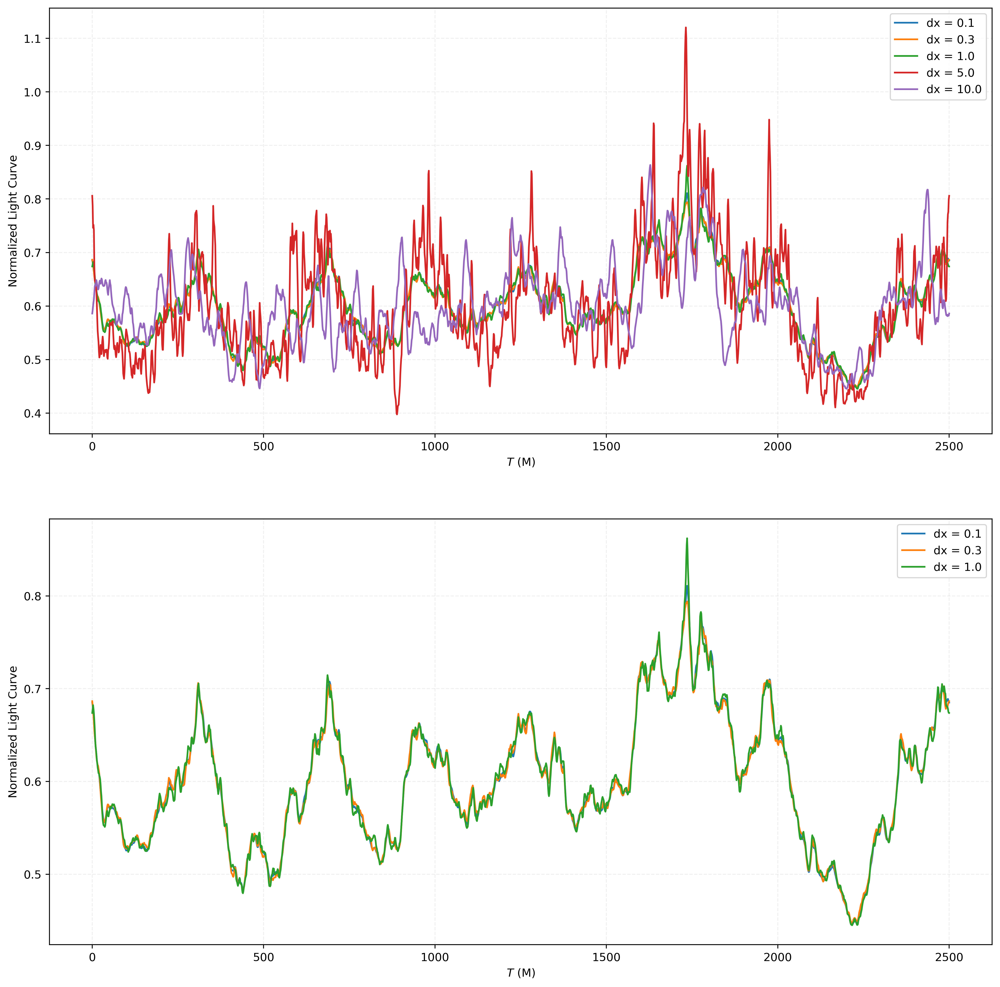

In [45]:

lc_01s  =  FluxFactor(data_01["SlowLight"])
lc_06s  =  FluxFactor(data_06["SlowLight"])
lc_1s   =   FluxFactor(data_1["SlowLight"])
lc_5s   =   FluxFactor(data_5["SlowLight"])
lc_10s  =  FluxFactor(data_10["SlowLight"])

plt.figure(figsize=(15,15),dpi=400)

#plt.title("Slow light Mode")

plt.subplot(2,1,1)
plt.plot(data_01["Time"],lc_01s,label="dx = 0.1")
plt.plot(data_06["Time"],lc_06s,label="dx = 0.3")
plt.plot(data_1["Time"],lc_1s,label="dx = 1.0")
plt.plot(data_5["Time"],lc_5s,label="dx = 5.0")
plt.plot(data_10["Time"],lc_10s,label="dx = 10.0")

plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Normalized Light Curve")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(2,1,2)
plt.plot(data_01["Time"],lc_01s,label="dx = 0.1")
plt.plot(data_06["Time"],lc_06s,label="dx = 0.3")
plt.plot(data_1["Time"],lc_1s,label="dx = 1.0")

plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Normalized Light Curve")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

#plt.savefig(rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\LC_SlowLight.png")
plt.show()

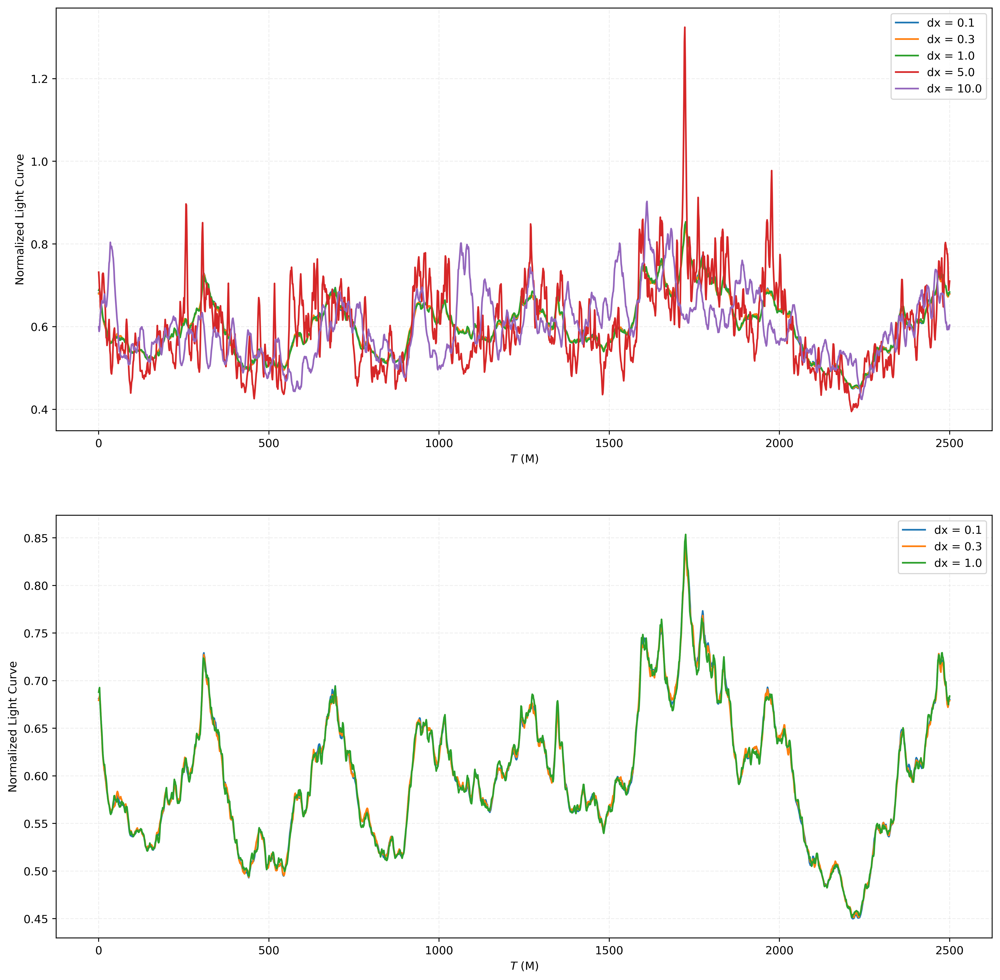

In [47]:
import matplotlib.pyplot as plt
import numpy as np

lc_01f  =  FluxFactor(data_01["FastLight"])
lc_06f  =  FluxFactor(data_06["FastLight"])
lc_1f   =  FluxFactor(data_1["FastLight"])
lc_5f   =  FluxFactor(data_5["FastLight"])
lc_10f  =  FluxFactor(data_10["FastLight"])

plt.figure(figsize=(15,15),dpi=400)

#plt.title("Fast light Mode")

plt.subplot(2,1,1)
plt.plot(data_01["Time"],lc_01f,label="dx = 0.1")
plt.plot(data_06["Time"],lc_06f,label="dx = 0.3")
plt.plot(data_1["Time"],lc_1f,label="dx = 1.0")
plt.plot(data_5["Time"],lc_5f,label="dx = 5.0")
plt.plot(data_10["Time"],lc_10f,label="dx = 10.0")

plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Normalized Light Curve")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(2,1,2)
plt.plot(data_01["Time"],lc_01f,label="dx = 0.1")
plt.plot(data_06["Time"],lc_06f,label="dx = 0.3")
plt.plot(data_1["Time"],lc_1f,label="dx = 1.0")

plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Normalized Light Curve")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

#plt.savefig(rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\LC_SlowLight.png")
plt.show()

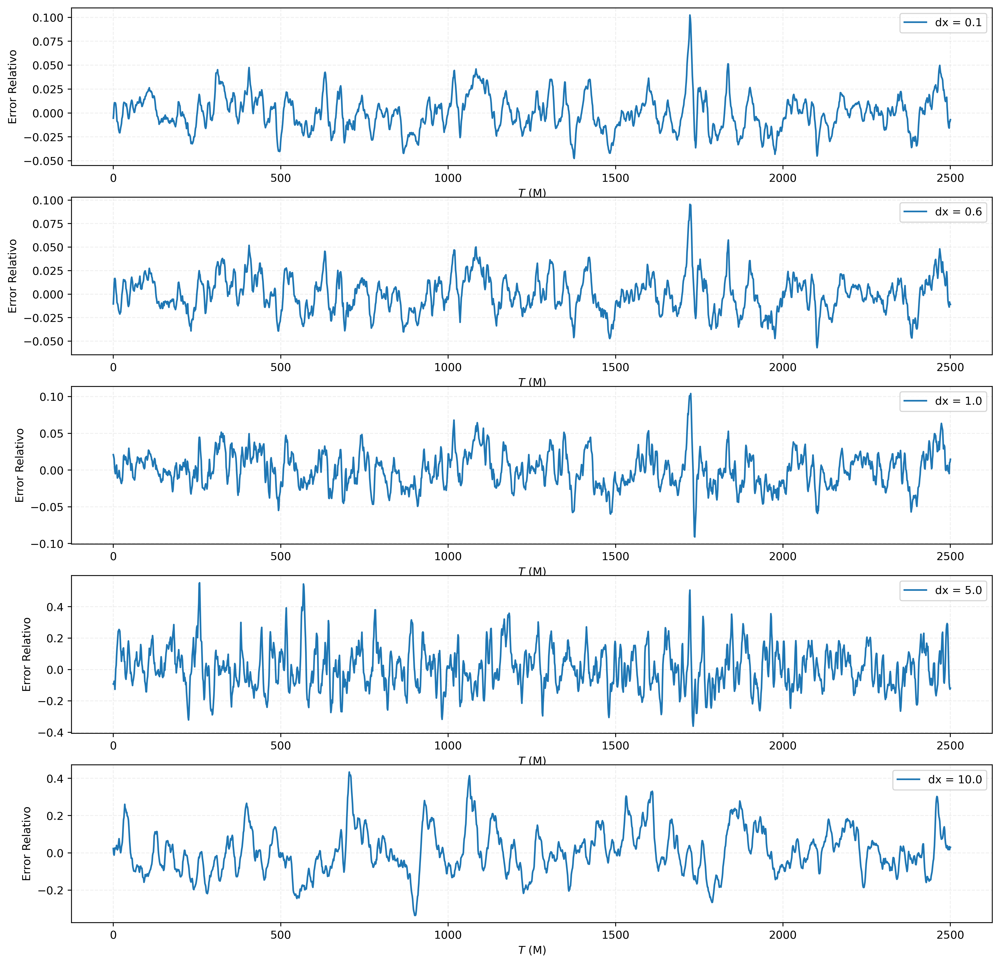

In [58]:

ErrorR_01  =  (FluxFactor(data_01["FastLight"])-FluxFactor(data_01["SlowLight"]))/FluxFactor(data_01["SlowLight"])
ErrorR_06  =  (FluxFactor(data_06["FastLight"])-FluxFactor(data_06["SlowLight"]))/FluxFactor(data_06["SlowLight"])
ErrorR_1   =  (FluxFactor(data_1["FastLight"])-FluxFactor(data_1["SlowLight"]))/FluxFactor(data_1["SlowLight"])
ErrorR_5   =  (FluxFactor(data_5["FastLight"])-FluxFactor(data_5["SlowLight"]))/FluxFactor(data_5["SlowLight"])
ErrorR_10  =  (FluxFactor(data_10["FastLight"])-FluxFactor(data_10["SlowLight"]))/FluxFactor(data_10["SlowLight"])

plt.figure(figsize=(15,15),dpi=400)

#plt.title("Fast light Mode")

plt.subplot(5,1,1)
plt.plot(data_01["Time"],ErrorR_01,label="dx = 0.1")

plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(5,1,2)
plt.plot(data_06["Time"],ErrorR_06,label="dx = 0.6")

plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(5,1,3)
plt.plot(data_1["Time"],ErrorR_1,label="dx = 1.0")

plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(5,1,4)
plt.plot(data_5["Time"],ErrorR_5,label="dx = 5.0")

plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(5,1,5)
plt.plot(data_10["Time"],ErrorR_10,label="dx = 10.0")

plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()
#plt.savefig(rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\LC_SlowLight.png")
plt.show()

## Analisis para diferentes cadencias de emisión ($dt=f_{tM}/\text{snapshots}$)

In [122]:
path_122   = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dt_changes\LightCurve_datas_dt1.22_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_244   = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dt_changes\LightCurve_datas_dt2.44_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_488   = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dt_changes\LightCurve_datas_dt4.88_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_733   = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dt_changes\LightCurve_datas_dt7.33_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_977   = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dt_changes\LightCurve_datas_dt9.77_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_1953  = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dt_changes\LightCurve_datas_dt19.53_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"
path_3906  = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dt_changes\LightCurve_datas_dt39.06_a0.94_i17.0_inoisy_n0.2_i0.94_ft2500_snap2048.csv"


data_122  = pd.read_csv(path_122)
data_244  = pd.read_csv(path_244)
data_488  = pd.read_csv(path_488)
data_733  = pd.read_csv(path_733)
data_977  = pd.read_csv(path_977)
data_1953 = pd.read_csv(path_1953)
data_3906 = pd.read_csv(path_3906)

In [124]:
# Lista de resoluciones y datos
resoluciones = [
    (data_122, 1.22),
    (data_244, 2.44),
    (data_488, 4.88),
    (data_733, 7.33),
    (data_977, 9.77),
    (data_1953, 19.53),
    (data_3906, 39.06)
]

# Recolectar todos los datos en un diccionario
datos_totales = {}
for data, dt in resoluciones:
    datos_totales[str(dt)] = calcular_metricas_winoisy(data, dt)

# Crear el DataFrame multiindex
df = pd.concat(
    {dt: pd.DataFrame(metricas) for dt, metricas in datos_totales.items()},
    axis=0
)

# Nombrar índices y columnas
df.index.names = ['Cadencia (dt)', 'Métrica']
df.columns.name = 'Comparación'

# Mostrar el DataFrame
df

,Comparación,Distancia L²,Distancia L¹,Correlación Pearson
Cadencia (dt),Métrica,,,
1.22,slow light vs fast light,0.320288,0.449845,0.985184
2.44,slow light vs fast light,0.320104,0.448782,0.985203
4.88,slow light vs fast light,0.315198,0.439873,0.985642
7.33,slow light vs fast light,0.306549,0.433307,0.986375
9.77,slow light vs fast light,0.299106,0.421467,0.987049
19.53,slow light vs fast light,0.279452,0.404121,0.988444
39.06,slow light vs fast light,0.258433,0.379207,0.990063


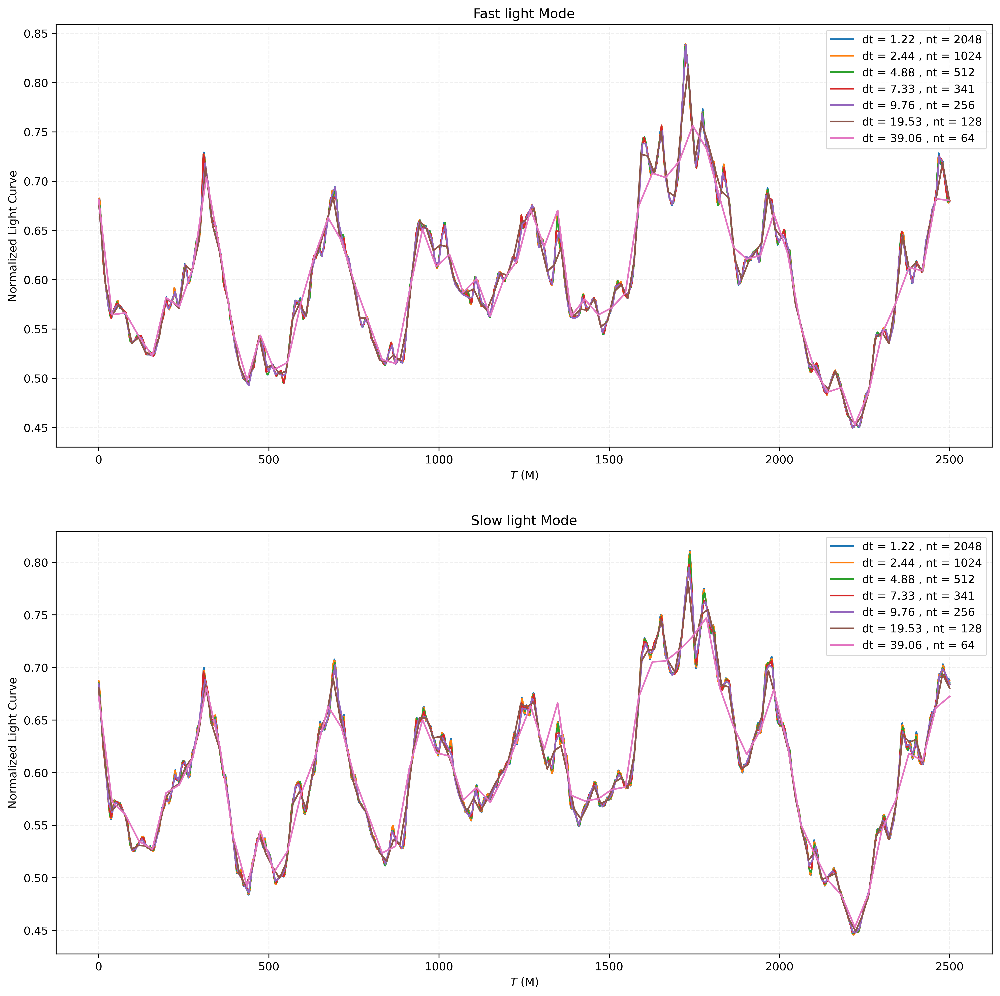

In [126]:
#### FAST LIGHT ####
lc_122_s  =  FluxFactor(data_122["SlowLight"])
lc_244_s  =  FluxFactor(data_244["SlowLight"])
lc_488_s  =  FluxFactor(data_488["SlowLight"])
lc_733_s  =  FluxFactor(data_733["SlowLight"])
lc_977_s  =  FluxFactor(data_977["SlowLight"])
lc_1953_s =  FluxFactor(data_1953["SlowLight"])
lc_3906_s =  FluxFactor(data_3906["SlowLight"])
#### Slow LIGHT ####
lc_122_f  =  FluxFactor(data_122["FastLight"])
lc_244_f  =  FluxFactor(data_244["FastLight"])
lc_488_f  =  FluxFactor(data_488["FastLight"])
lc_733_f  =  FluxFactor(data_733["FastLight"])
lc_977_f  =  FluxFactor(data_977["FastLight"])
lc_1953_f =  FluxFactor(data_1953["FastLight"])
lc_3906_f =  FluxFactor(data_3906["FastLight"])

plt.figure(figsize=(15,15),dpi=400)

plt.subplot(2,1,1)
plt.title("Fast light Mode")
plt.plot(data_122["Time"],lc_122_f,label=f"dt = 1.22 , nt = {len(lc_122)}")
plt.plot(data_244["Time"],lc_244_f,label=f"dt = 2.44 , nt = {len(lc_244)}")
plt.plot(data_488["Time"],lc_488_f,label=f"dt = 4.88 , nt = {len(lc_488)}")
plt.plot(data_733["Time"],lc_733_f,label=f"dt = 7.33 , nt = {len(lc_733)}")
plt.plot(data_977["Time"],lc_977_f,label=f"dt = 9.76 , nt = {len(lc_977)}")
plt.plot(data_1953["Time"],lc_1953_f,label=f"dt = 19.53 , nt = {len(lc_1953)}")
plt.plot(data_3906["Time"],lc_3906_f,label=f"dt = 39.06 , nt = {len(lc_3906)}")

plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Normalized Light Curve")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(2,1,2)
plt.title("Slow light Mode")
plt.plot(data_122["Time"],lc_122_s,label=f"dt = 1.22 , nt = {len(lc_122)}")
plt.plot(data_244["Time"],lc_244_s,label=f"dt = 2.44 , nt = {len(lc_244)}")
plt.plot(data_488["Time"],lc_488_s,label=f"dt = 4.88 , nt = {len(lc_488)}")
plt.plot(data_733["Time"],lc_733_s,label=f"dt = 7.33 , nt = {len(lc_733)}")
plt.plot(data_977["Time"],lc_977_s,label=f"dt = 9.76 , nt = {len(lc_977)}")
plt.plot(data_1953["Time"],lc_1953_s,label=f"dt = 19.53 , nt = {len(lc_1953)}")
plt.plot(data_3906["Time"],lc_3906_s,label=f"dt = 39.06 , nt = {len(lc_3906)}")

plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Normalized Light Curve")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

#plt.savefig(rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\Results\Imagenes\LC_SlowLight.png")
plt.show()

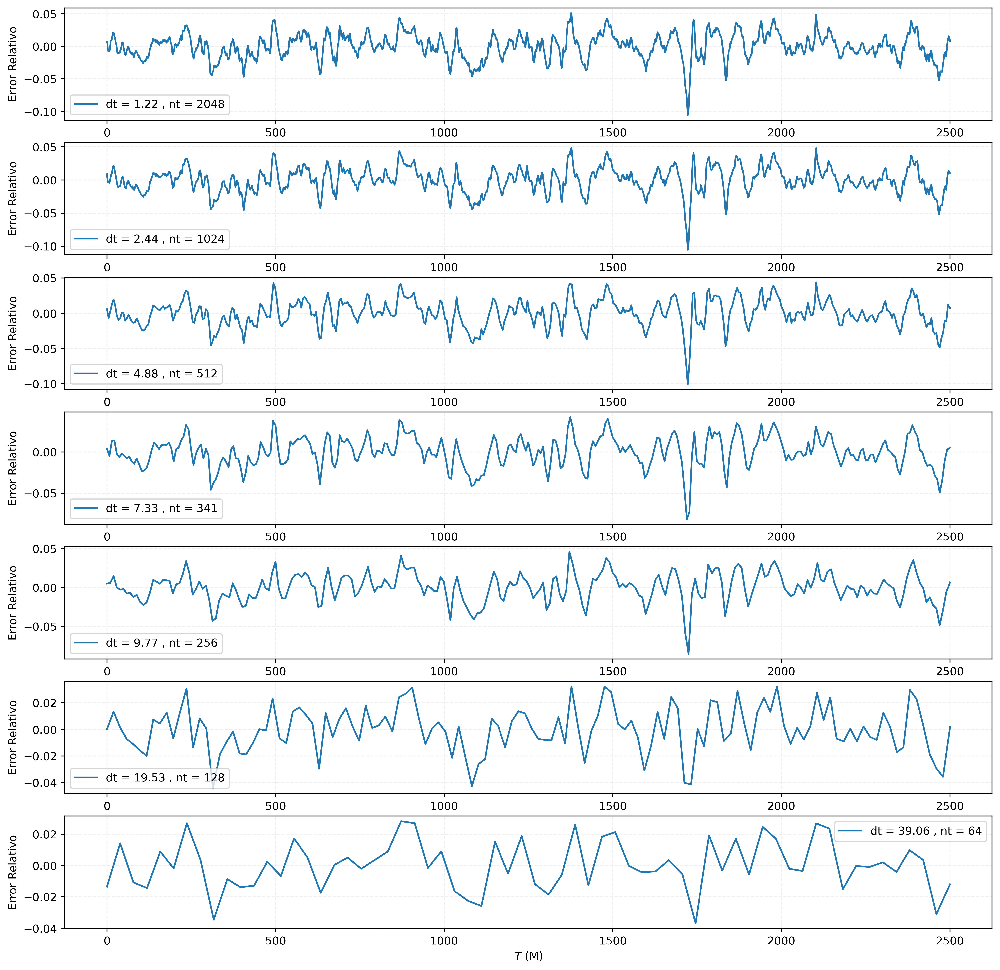

In [127]:
#### Error ####
ErrorR_122  =  (FluxFactor(data_122["SlowLight"]) - FluxFactor(data_122["FastLight"]))/FluxFactor(data_122["SlowLight"]) 
ErrorR_244  =  (FluxFactor(data_244["SlowLight"]) - FluxFactor(data_244["FastLight"]))/FluxFactor(data_244["SlowLight"]) 
ErrorR_488  =  (FluxFactor(data_488["SlowLight"]) - FluxFactor(data_488["FastLight"]))/FluxFactor(data_488["SlowLight"]) 
ErrorR_733  =  (FluxFactor(data_733["SlowLight"]) - FluxFactor(data_733["FastLight"]))/FluxFactor(data_733["SlowLight"]) 
ErrorR_977  =  (FluxFactor(data_977["SlowLight"]) - FluxFactor(data_977["FastLight"]))/FluxFactor(data_977["SlowLight"]) 
ErrorR_1953 =  (FluxFactor(data_1953["SlowLight"]) - FluxFactor(data_1953["FastLight"]))/FluxFactor(data_1953["SlowLight"])
ErrorR_3906 =  (FluxFactor(data_3906["SlowLight"]) - FluxFactor(data_3906["FastLight"]))/FluxFactor(data_3906["SlowLight"])

plt.figure(figsize=(15,15),dpi=400)

plt.subplot(7,1,1)
plt.plot(data_122["Time"],ErrorR_122,label=f"dt = 1.22 , nt = {len(lc_122)}")
plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(7,1,2)
plt.plot(data_244["Time"],ErrorR_244,label=f"dt = 2.44 , nt = {len(lc_244)}")
plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(7,1,3)
plt.plot(data_488["Time"],ErrorR_488,label=f"dt = 4.88 , nt = {len(lc_488)}")
plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(7,1,4)
plt.plot(data_733["Time"],ErrorR_733,label=f"dt = 7.33 , nt = {len(lc_733)}")
plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(7,1,5)
plt.plot(data_977["Time"],ErrorR_977,label=f"dt = 9.77 , nt = {len(lc_977)}")
plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(7,1,6)
plt.plot(data_1953["Time"],ErrorR_1953,label=f"dt = 19.53 , nt = {len(lc_1953)}")
plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(7,1,7)
plt.plot(data_3906["Time"],ErrorR_3906,label=f"dt = 39.06 , nt = {len(lc_3906)}")
plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

#plt.savefig(rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\Results\Imagenes\LC_SlowLight.png")
plt.show()

### with different noise (0.4)

In [130]:
path_122   = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dt_changes\LightCurve_datas_dt1.22_a0.94_i17.0_inoisy_n0.4_i0.94_ft2500_snap2048.csv"
path_1953  = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dt_changes\LightCurve_datas_dt19.53_a0.94_i17.0_inoisy_n0.4_i0.94_ft2500_snap2048.csv"
path_3906  = rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\\Results\data_dt_changes\LightCurve_datas_dt39.06_a0.94_i17.0_inoisy_n0.4_i0.94_ft2500_snap2048.csv"

data_122  = pd.read_csv(path_122)
data_1953 = pd.read_csv(path_1953)
data_3906 = pd.read_csv(path_3906)


In [132]:
resoluciones = [
    (data_122, 1.22),
    (data_1953, 19.53),
    (data_3906, 39.06)
]
# Recolectar todos los datos en un diccionario
datos_totales = {}
for data, dt in resoluciones:
    datos_totales[str(dt)] = calcular_metricas_winoisy(data, dt)
# Crear el DataFrame multiindex
df = pd.concat(
    {dt: pd.DataFrame(metricas) for dt, metricas in datos_totales.items()},
    axis=0
)
# Nombrar índices y columnas
df.index.names = ['Cadencia (dt)', 'Métrica']
df.columns.name = 'Comparación'
# Mostrar el DataFrame
df

,Comparación,Distancia L²,Distancia L¹,Correlación Pearson
Cadencia (dt),Métrica,,,
1.22,slow light vs fast light,0.496378,0.540171,0.964414
19.53,slow light vs fast light,0.340795,0.461911,0.982499
39.06,slow light vs fast light,0.302899,0.417731,0.986363


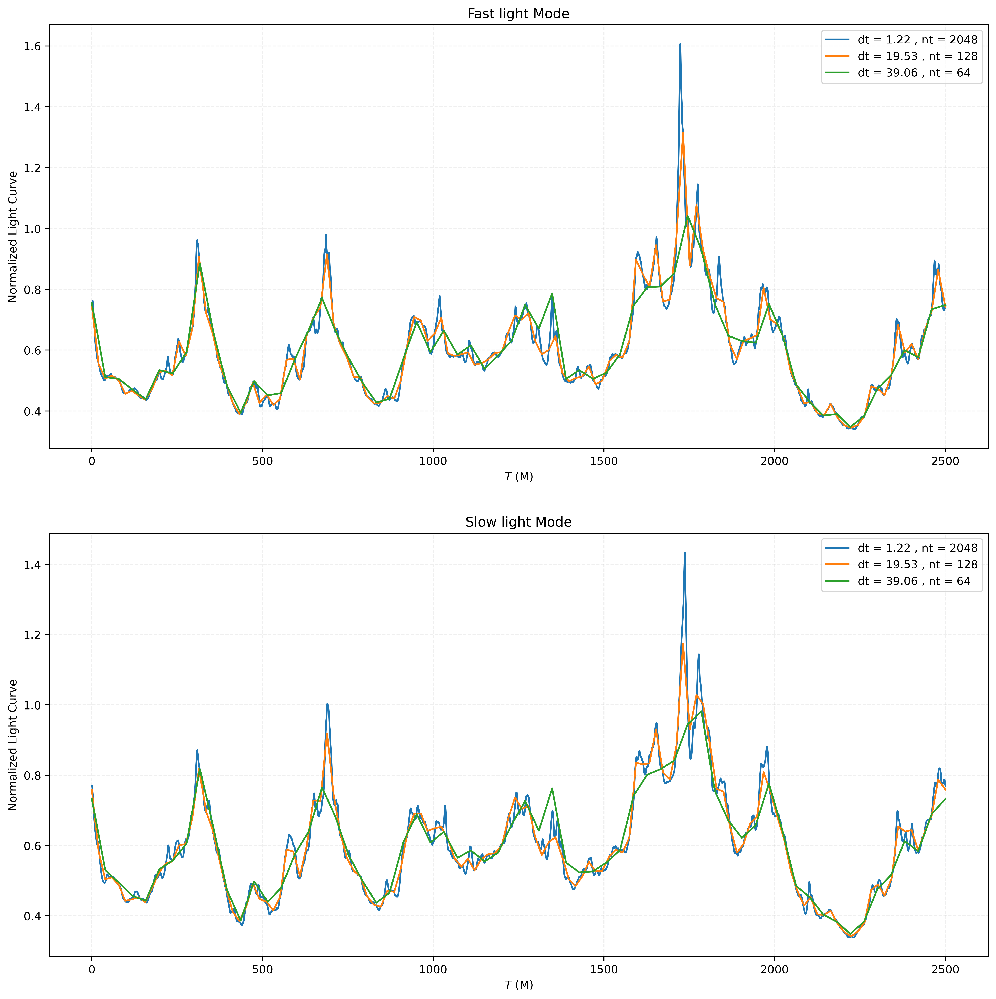

In [134]:
#### FAST LIGHT ####
lc_122_f  =  FluxFactor(data_122["FastLight"])
lc_1953_f =  FluxFactor(data_1953["FastLight"])
lc_3906_f =  FluxFactor(data_3906["FastLight"])

#### Slow LIGHT ####
lc_122_s  =  FluxFactor(data_122["SlowLight"])
lc_1953_s =  FluxFactor(data_1953["SlowLight"])
lc_3906_s =  FluxFactor(data_3906["SlowLight"])


plt.figure(figsize=(15,15),dpi=400)

plt.subplot(2,1,1)
plt.title("Fast light Mode")

plt.plot(data_122["Time"],lc_122_f,label=f"dt = 1.22 , nt = {len(lc_122)}")
plt.plot(data_1953["Time"],lc_1953_f,label=f"dt = 19.53 , nt = {len(lc_1953)}")
plt.plot(data_3906["Time"],lc_3906_f,label=f"dt = 39.06 , nt = {len(lc_3906)}")

plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Normalized Light Curve")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(2,1,2)
plt.title("Slow light Mode")

plt.plot(data_122["Time"],lc_122_s,label=f"dt = 1.22 , nt = {len(lc_122)}")
plt.plot(data_1953["Time"],lc_1953_s,label=f"dt = 19.53 , nt = {len(lc_1953)}")
plt.plot(data_3906["Time"],lc_3906_s,label=f"dt = 39.06 , nt = {len(lc_3906)}")

plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Normalized Light Curve")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

#plt.savefig(rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\Results\Imagenes\LC_SlowLight.png")
plt.show()

In [ ]:
#### Error ####
ErrorR_122  =  (FluxFactor(data_122["SlowLight"]) - FluxFactor(data_122["FastLight"]))/FluxFactor(data_122["SlowLight"]) 
ErrorR_1953 =  (FluxFactor(data_1953["SlowLight"]) - FluxFactor(data_1953["FastLight"]))/FluxFactor(data_1953["SlowLight"])
ErrorR_3906 =  (FluxFactor(data_3906["SlowLight"]) - FluxFactor(data_3906["FastLight"]))/FluxFactor(data_3906["SlowLight"])

plt.figure(figsize=(15,15),dpi=400)

plt.subplot(3,1,1)
plt.plot(data_122["Time"],ErrorR_122,label=f"dt = 1.22 , nt = {len(lc_122)}")
plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(3,1,2)
plt.plot(data_1953["Time"],ErrorR_1953,label=f"dt = 19.53 , nt = {len(lc_1953)}")
plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

plt.subplot(3,1,3)
plt.plot(data_3906["Time"],ErrorR_3906,label=f"dt = 39.06 , nt = {len(lc_3906)}")
plt.xlabel(r"$T$"+" "+"(M)")
plt.ylabel(r"Error Relativo")
plt.grid(linestyle="--",alpha=0.2)
plt.legend()

#plt.savefig(rf"C:\Users\danyp\OneDrive\Escritorio\CosasPater\UNAL\TrabajoGradoAlejandro\Results\Imagenes\LC_SlowLight.png")
plt.show()

# Change Emession Rate

In [7]:
i_tM = 0
f_tM = 2*np.pi
snapshots = 50

T_data = np.linspace(i_tM,f_tM,snapshots)
data = np.cos(T_data)


In [13]:
k = 5
def Lower_dt(data,T_data,k):
    snapshots_reduced = snapshots // k

    selected_indices = np.linspace(0, snapshots-1, snapshots_reduced, dtype=int)

    data_N = np.zeros(len(selected_indices))
    Time_N = np.zeros(len(selected_indices))
    for i in range(len(selected_indices)):
        j = selected_indices[i]
        data_N[i] =  data[j]
        Time_N[i] =  T_data[j]
        
    return Time_N, data_N

Time_N , data_N = Lower_dt(data,T_data,k)

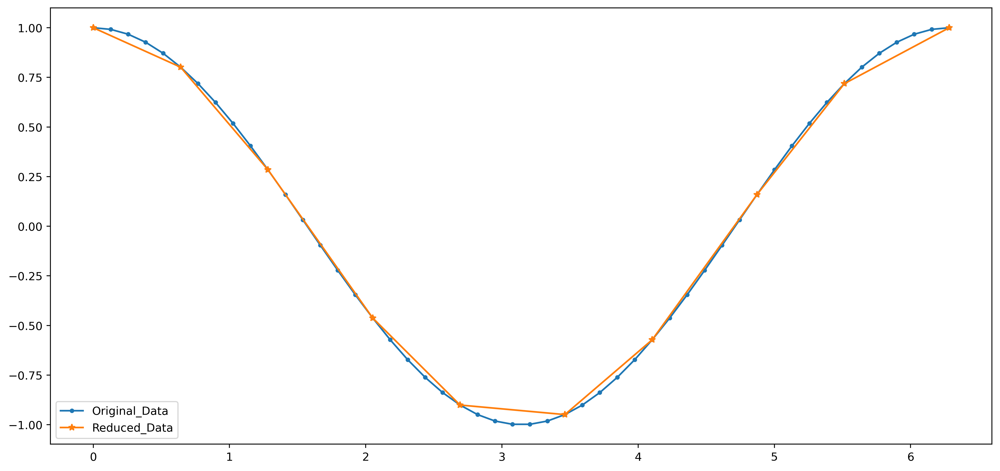

In [15]:
plt.figure(figsize=(15,7),dpi=400)

plt.plot(T_data,data,label="Original_Data", marker = ".")
plt.plot(Time_N,data_N,label="Reduced_Data",marker = "*")

plt.legend()

plt.show()